## Load the model

In [1]:
import sys
sys.path.append("/home/kizner.gil/beatbox-research/src/beatbox_research")
sys.path.append("/home/kizner.gil/beatbox-research")

%load_ext autoreload
%autoreload 2
import explainability.gradient as gradient
import explainability.utils as utils
import explainability.image_processing as image_processing
from image_processing import mask_overlay
from utils import load_model, npy_to_tensor, tensor_to_image, load_image, min_max_normalization, tensor_to_npy
from gradient import smooth_grad, jacobian_to_mask
import warnings
import torch
import cv2
import numpy as np
from matplotlib import pyplot as plt

warnings.filterwarnings('ignore')

In [2]:
model_dir = r"/home/kizner.gil/beatbox-research/explainability"
model_filename = "Exp2122_ECG_All_in_One_GOLD_GPU0_Right_Bundle_Branch_Block_epoch_49.pt"
#image
image_path = "/home/kizner.gil/beatbox-research/explainability/good.jpeg";
width = 1650
height = 880

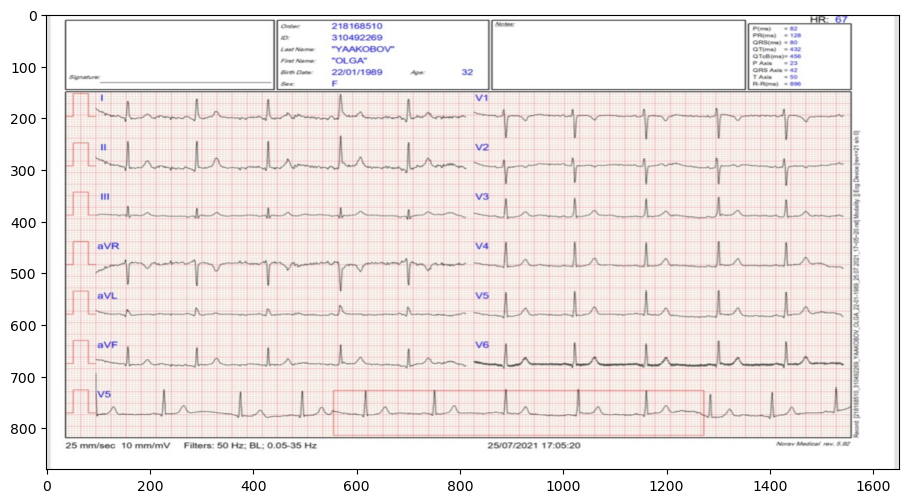

In [3]:
img = load_image(image_path, width, height)
model = load_model(path=model_dir, model_name=model_filename, device="cuda:0")
plt.figure(figsize=(11, 10))
plt.imshow(img)
plt.show()

In [4]:
img_tensor = min_max_normalization(npy_to_tensor(img))
input_image = img_tensor.cuda()

## Saliency Maps

In this cell, we create a **Saliency Map** to show which parts of the input image have the most influence on the model's prediction. A saliency map highlights the areas of the image that have the greatest impact on the model's decision. This is determined by the largest gradient values—since a small change in a pixel with a high gradient will significantly affect the output compared to other pixels.

We set the model to evaluation mode and enable gradient calculation for the input image. The model’s output is then computed, and the target class is identified. After that, we calculate the gradient of this output with respect to the input image.

The saliency map is created by taking the maximum absolute gradient value across channels, emphasizing the important pixels. Finally, the saliency map is normalized, resized, and overlaid on the original image to visualize where the model focuses its attr most.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


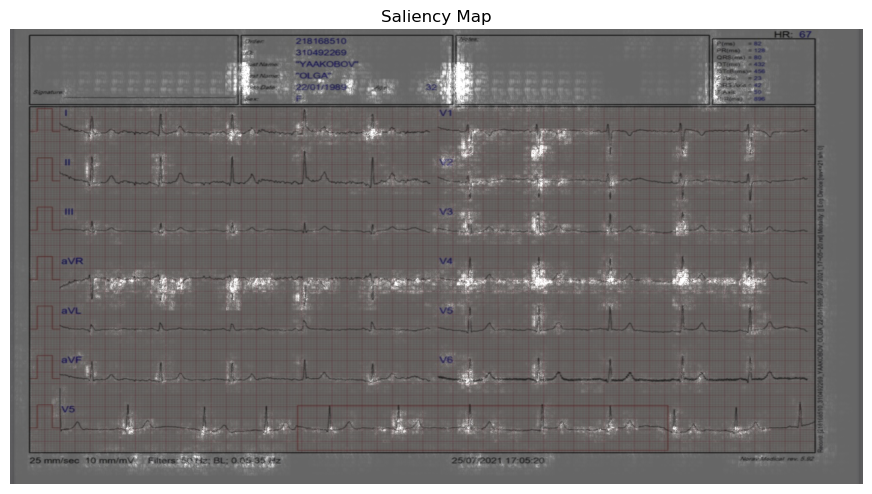

In [5]:
def plot_sailency_map(model, input_image):
    model.eval()
    input_image.requires_grad_()
    output = model(input_image)
    target_output = output[1]
    output_idx = target_output.argmax()
    model.zero_grad()
    target_output[0, output_idx].backward()
    gradients = input_image.grad.data
    saliency, _ = torch.max(gradients.abs(), dim=1)
    saliency = saliency.cpu().numpy().squeeze()
    
    saliency_map = saliency
    original_image = img
    
    saliency_map = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
    saliency_map = cv2.resize(saliency_map, (original_image.shape[1], original_image.shape[0]))
    
    if len(original_image.shape) == 2:
        original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB)
    
    original_image = original_image.astype(np.float32) / 255.0
    saliency_map = np.stack([saliency_map] * 3, axis=-1)
    
    saliency_map = saliency_map * 2.0
    
    overlay = cv2.addWeighted(original_image, 0.4, saliency_map, 3, 0)

    plt.figure(figsize=(11, 10))
    plt.imshow(overlay)
    plt.title('Saliency Map')
    plt.axis('off')
    plt.show()

plot_sailency_map(model, input_image)

#### Conclusions:

1. The model assigns high importance to irrelevant pixels, such as lines that form cell borders and text containing patient information like names (which are likely irrelevant). A simple solution would be to ensure that the input image is properly cropped.

2. The model correctly assigns high importance to critical pixels, particularly those corresponding to significant ECG changes (e.g., high pulses), which indicates that it is focusing on relevant featues.


#### Cropped image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


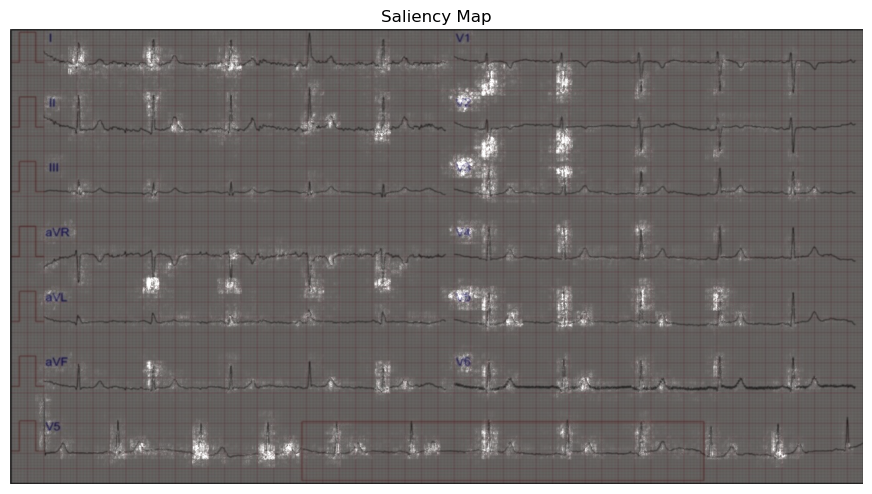

In [6]:
#cropped image
image_path = "/home/kizner.gil/beatbox-research/explainability/cropped.jpg"
width = 1650
height = 880
img = load_image(image_path, width, height)
input_image = min_max_normalization(npy_to_tensor(img)).cuda()
plot_sailency_map(model, input_image)

Looks better! 

But.. Although the gradients appear generally well-placed, they are spread over a large area, much of which seems irrelevant. This creates "clouds" of gradients that we would like to sharpen for a clearer interpretation.

## SmoothGrad*SmoothGrad* is a method used to make gradient maps clearer and easier to understand. It works by reducing the noise in the gradient map by averaging the gradients of several slightly different versions of the input image.

How It Works:
1. Create Noisy Copies: Make n copies of the original image, each one slightly changed by adding small Gaussian noise.

2. Calculate Gradients: For each noisy copy, calculate the gradient of the model's output with respect to the input image. This gradient shows how much the model's prediction changes when the input image is slightly changed.

3. Average the Gradients: By averaging the gradients of these noisy images, SmoothGrad reduces the noise in the gradient map, making the saliency map clearer and more useful.ency maps.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


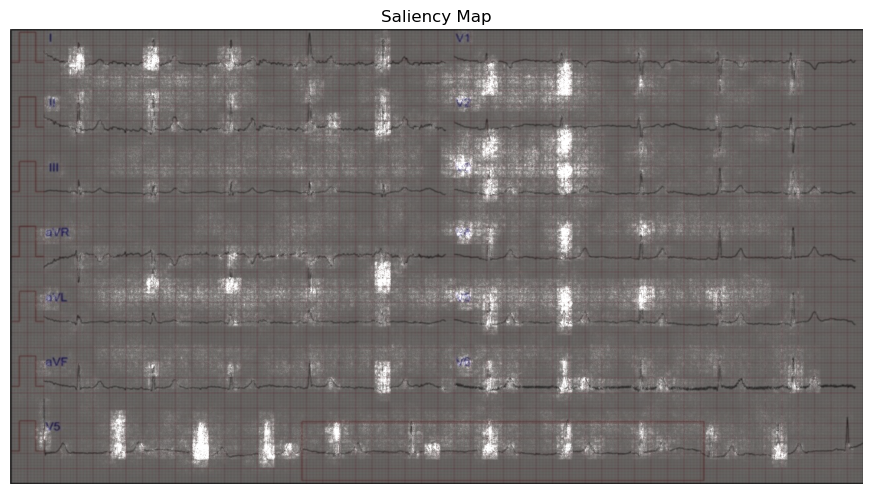

In [7]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

def plot_smoothgrad_map(model, input_image, stdev_spread=0.15, nt_samples=50):
    model.eval()
    input_image.requires_grad_()
    smooth_grad = torch.zeros_like(input_image)

    for i in range(nt_samples):

        noise = torch.normal(mean=0, std=(stdev_spread * (input_image.max() - input_image.min())).item(), size=input_image.shape).to(input_image.device)
        noisy_input = input_image + noise

        output = model(noisy_input)
        target_output = output[1]  
        output_idx = target_output.argmax(dim=1) 
        
        model.zero_grad()
        target_output[0, output_idx].backward()
        smooth_grad += input_image.grad.data

    smooth_grad /= nt_samples
    
    gradients = smooth_grad
    saliency, _ = torch.max(gradients.abs(), dim=1)
    saliency = saliency.cpu().numpy().squeeze()
    
    saliency_map = saliency
    original_image = img
    
    saliency_map = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
    saliency_map = cv2.resize(saliency_map, (original_image.shape[1], original_image.shape[0]))
    
    if len(original_image.shape) == 2:
        original_image = cv2.cvtColor(original_image, cv2.COLOR_GRAY2RGB)
    
    original_image = original_image.astype(np.float32) / 255.0
    saliency_map = np.stack([saliency_map] * 3, axis=-1)
    
    saliency_map = saliency_map * 2.0
    
    overlay = cv2.addWeighted(original_image, 0.4, saliency_map, 3, 0)

    plt.figure(figsize=(11, 10))
    plt.imshow(overlay)
    plt.title('Saliency Map')
    plt.axis('off')
    plt.show()
    return overlay

overlay1 = plot_smoothgrad_map(model, input_image)

We can also try to see how  the method works on a positive result, meaning an ECG with Wolff-Parkinson-White desease

Forward pass on the Wolff-Parkinson-White disease image is: 0.9904628992080688


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


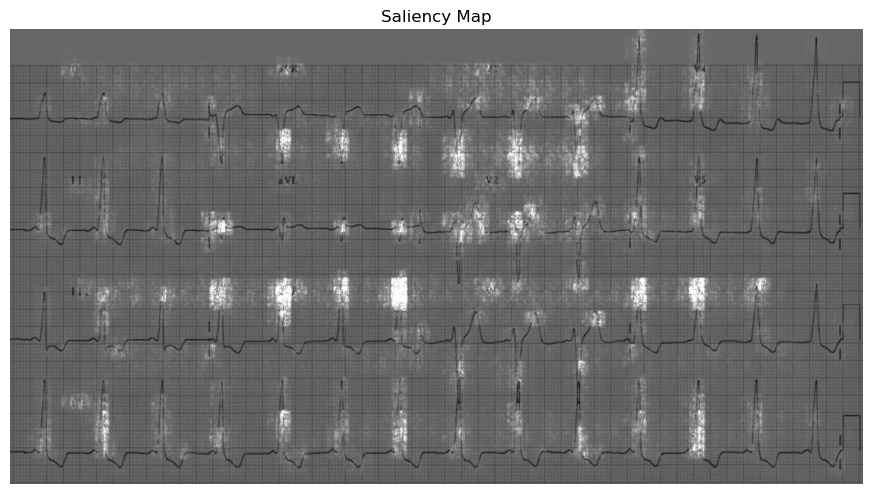

In [8]:
#Wolff-Parkinson-White image
image_path = "/home/kizner.gil/beatbox-research/explainability/Wolff-Parkinson-White.jpg"
width = 1650
height = 880
img = load_image(image_path, width, height)
input_image = min_max_normalization(npy_to_tensor(img)).cuda()
value = model.forward(input_image)[1].item()
print(f"Forward pass on the Wolff-Parkinson-White disease image is: {value}")
overlay_2 = plot_smoothgrad_map(model, input_image)

## LIME
Next, we will provide an explanation using **Local Interpretable Model-agnostic Explanations (LIME)**. LIME can be applied to any machine learning model by focusing on individual predictions. For each prediction, the input is slightly perturbed, and a simpler model (such as a decision tree or regression model) is trained to predict which pixels most contribute to changes in the prediction.

It's interesting to think that LIME explains a complex model by using a simple one! This approach helps make the model's complex decisions more visual by breaking them down into something easier to understand.

We defined a prediction function that follows the usual pipeline: min-max normalization, dimension rearrangement (for LIME), a forward pass through the model, and outputting a probability prediction array (for multiple images).

We then initialize an instance of the LIME explainer, use its `explain_instance` function, and plot the image with explanations using LIME's `get_image_and_mask` function.untion.


In [9]:
from lime import lime_image
from PIL import Image
from skimage.segmentation import felzenszwalb, quickshift, mark_boundaries 

def predict_function(images):
    predictions = []
    for img in images:
        img_tensor = min_max_normalization(npy_to_tensor(img))
        img_tensor = img_tensor.unsqueeze(0)  # Add batch dimension
        img_tensor = img_tensor.squeeze(1)   
        input_image = img_tensor.cuda()

        #Forward
        output = model(input_image)

        #output[1] = logit
        output_tensor = output[1]

        #convert to probabilities?? I think I must
        prob = torch.sigmoid(output_tensor).cpu().detach().numpy()
        prob = prob.flatten()
        predictions.append(prob)
    return np.array(predictions)


explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(
    np.array(img),
    predict_function,
    top_labels=2,
    hide_color=0,
    num_samples=200,      ##If have time let it practice on 200 @!!!!!!!!!!!!
    segmentation_fn=felzenszwalb
)


  0%|          | 0/200 [00:00<?, ?it/s]

[0]


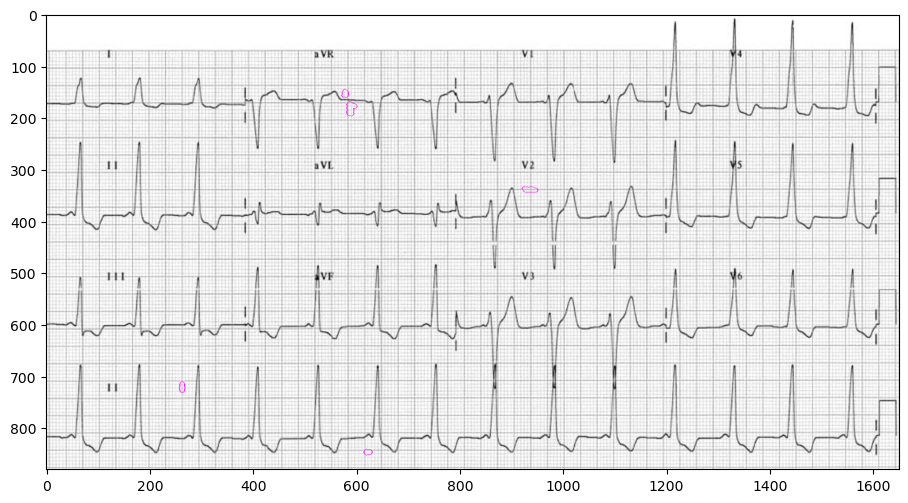

In [10]:
from skimage.morphology import dilation, disk

print(explanation.top_labels) #these are the labels Lime considers I think 0 is for negative output and 1 for positive
class_to_explain = explanation.top_labels[0]

temp, mask = explanation.get_image_and_mask(
    class_to_explain,
    positive_only=True,
    num_features=5,
    hide_rest=False
)

dilated_mask = dilation(mask, disk(3))

plt.figure(figsize=(11, 10))
image_with_boundaries = mark_boundaries(temp, dilated_mask, color=(1, 0, 1)) #purple
plt.imshow(image_with_boundaries) 
plt.imsave('output_lime.png', image_with_boundaries)
plt.show()

Interestingly, we noticed that LIME's simpler model highlighted regions (in purple) that don’t have a strong gradient, while there are regions with a high gradient that are not marked. Additionally, all the highlighted regions don't actually touch the ECG line, which might not be a good sign.

## Counterfactual Explanation


The initial value of our cropped image ispositivee, which suggests thatthere is not disease, as can be shown::


In [11]:
model = load_model(path=model_dir, model_name=model_filename, device="cuda:0")
img_counter = load_image(image_path, width, height)
input_image_counter = min_max_normalization(npy_to_tensor(img)).cuda()
starting_value = model.forward(input_image_counter)[1].item()
print(f"Starting output is:{starting_value} ")

Starting output is:0.9904628992080688 


Now we ask ourselves: what is the smallest change that can be made to the image so that the classification flips (false negative), meaning it gives a negative score (logit) to the image? Of course, we need to ensure that the change is minimal and, preferably, one that a human eye could not detect.

To achieve this, we define a simple loss function:

$$
\text{Loss}_{\text{counterfactual}} = \text{model}(\text{image})[1]
$$

This means positive logit values result in a higher loss compared to negative ones. I will attempt to optimize this loss using the well-known gradient descent method. Note that other optimization methods, such as Newton's method, BFGS, and more, could also be applied here.

After this, we compute a forward and backward pass (after resetting the gradients) and calculate the gradient of the loss with respect to the image:

$$
\frac{\partial \text{Loss}_{\text{counterfactual}}}{\partial \text{image}} = \frac{\partial \text{Loss}_{\text{counterfactual}}}{\partial \text{model}(\text{image})[1]} \cdot \frac{\partial \text{model}(\text{image})[1]}{\partial \text{image}}
$$

Once this is done, we can move in the opposite direction of the gradient with respect to the image in order to reduce the loss function—effectively making the output more "negative." This will be done iteratively, with the definition of hyperparameters such as `max_iterations` and `epsilon` (step size).

Another hyperparameter is the desired class. Here, I aim to create a counterfactual image with a negative logit, and another with a logit smaller than -1.


Negative output_class achieved after 200 iterations.
Smaller than (-1) output_class achieved after 409 iterations.


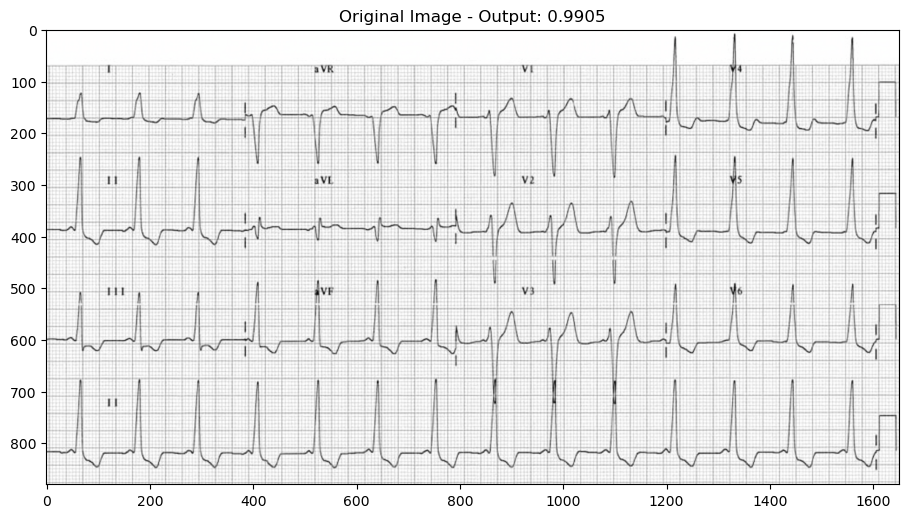

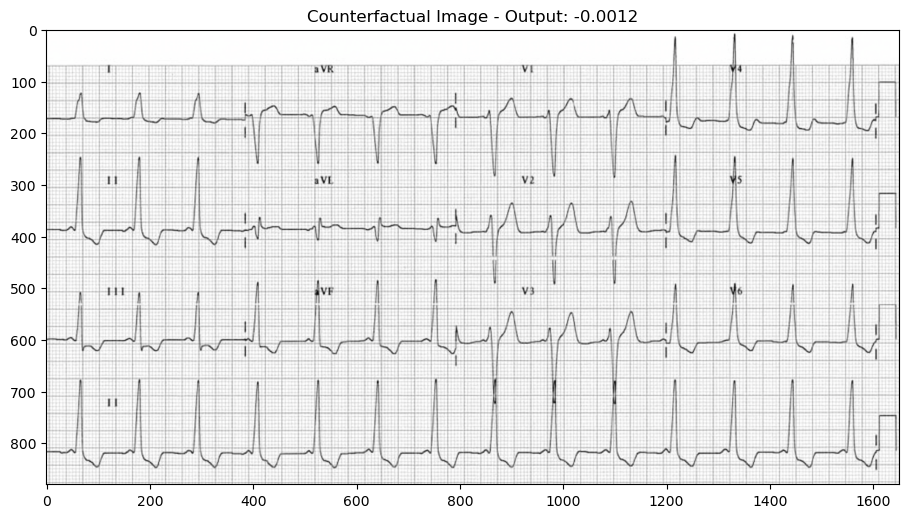

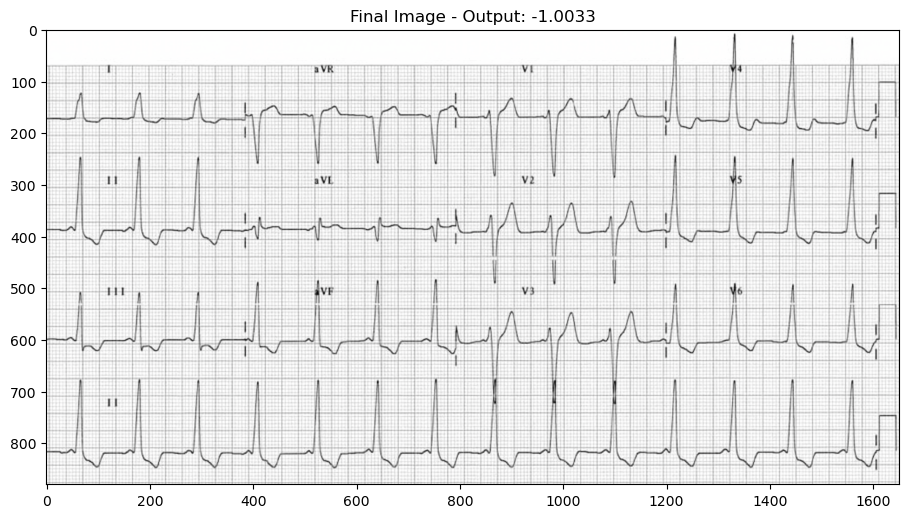

In [12]:
import torch.nn.functional as F


model.eval()
epsilon = 1e-6
max_iterations = 500
iteration = 0

original_image = input_image_counter
input_image_counter_0 = input_image_counter
zero_initialized = False
zero_output_class = None

while iteration <= max_iterations:
    input_image_counter.requires_grad = True
    output_class = model.forward(input_image_counter)[1]
    
    if output_class.item() < 0 and not zero_initialized:
        print(f"Negative output_class achieved after {iteration} iterations.")
        input_image_counter_0 = input_image_counter
        zero_output_class = output_class.item()
        zero_initialized = True

    if output_class.item() < -1:
        print(f"Smaller than (-1) output_class achieved after {iteration} iterations.")
        input_image_counter
        break
        
    loss = output_class
    model.zero_grad()
    loss.backward()

    with torch.no_grad():
        input_image_counter -= epsilon * input_image_counter.grad.sign()
        input_image_counter = torch.clamp(input_image_counter, 0, 1)

    iteration += 1
    
    if iteration >= max_iterations:
        print("Reached maximum iterations without achieving a positive output_class.")

_, final_output_class, _ = model(input_image_counter)

#Here I display the original VS counterfactural images
original_image_counter_cpu = original_image.cpu().detach().numpy().squeeze()
original_image_counter_cpu = original_image_counter_cpu.transpose(1, 2, 0)
original_image_counter_cpu = np.clip(original_image_counter_cpu, 0, 1)
plt.figure(figsize=(11, 10))
plt.imshow(original_image_counter_cpu, cmap='gray')
plt.title(f"Original Image - Output: {starting_value:.4f}")
plt.show()

input_image_counter_0_cpu = input_image_counter_0.cpu().detach().numpy().squeeze()
input_image_counter_0_cpu = input_image_counter_0_cpu.transpose(1, 2, 0)
input_image_counter_0_cpu = np.clip(input_image_counter_0_cpu, 0, 1)
plt.figure(figsize=(11, 10))
plt.imshow(input_image_counter_0_cpu, cmap='gray')
plt.title(f"Counterfactual Image - Output: {zero_output_class:.4f}")
plt.show()

input_image_counter_cpu = input_image_counter.cpu().detach().numpy().squeeze()
input_image_counter_cpu = input_image_counter_cpu.transpose(1, 2, 0)
input_image_counter_cpu = np.clip(input_image_counter_cpu, 0, 1)
plt.figure(figsize=(11, 10))
plt.imshow(input_image_counter_cpu, cmap='gray')
plt.title(f"Final Image - Output: {final_output_class.item():.4f}")
plt.show()


As we can see (or cannot see), the change is very small. The modification is primarily a slight perturbation to each pixel, potentially altering the brightness of the image or creating subtle, widespread changes that are not noticeable to the human eye. This behavior might indicate that the model is not robust to changes in settings and could be overfitting to the training data or other factors such as noise or specific patterns present in the training dataset.

As suggested in the literature, such small perturbations that significantly alter model predictions can reveal vulnerabilities in the model, indicating potential overfitting or sensitivity to minor input variation.


## Captum AI - Occlusion-based attribution
So far, we have explored explanations that focus on individual pixels or the relationships between relatively close pixels. However, an interesting question is whether the model considers relationships between pixels that are farther apart, indicating that larger areas are evaluated as a whole.

To investigate this, we can use the **sliding window method**. In this approach, a gray square patch is moved across the image with predefined dimensions and stride. Each time, we cover a different area of the image and observe how the model's output changes. Areas that significantly impact the model's output when covered are likely important features. By using a relatively large square (window), we can analyze how distant pixels, forming broader regions, influence the model's decisions.
ns.


In [13]:
import torch.nn as nn

img = load_image(image_path, width, height)
input_image = min_max_normalization(npy_to_tensor(img)).cuda()

class ModelWrapper(nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def __call__(self, x):
        return self.forward(x)
    
    def forward(self, x):
        output_autoencoder, output_class, output_domain = self.model(x)
        return output_class

wrapped_model = ModelWrapper(model)

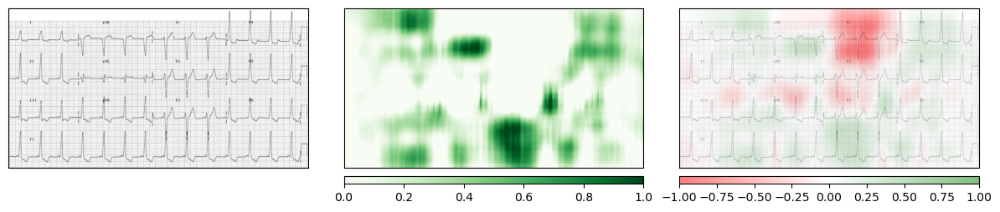

In [14]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from captum.attr import Occlusion, visualization as viz

attributions_occ = None

def forward_wrapper(input_image):
    _, output_class, _ = model(input_image)
    return output_class.unsqueeze(0)


wrapped_model.eval()
input_image = input_image.requires_grad_(True)

occlusion = Occlusion(forward_wrapper)

attributions_occ = occlusion.attribute(input_image,
                                       strides=(3, 8, 8),
                                       target=0, 
                                       sliding_window_shapes=(3, 90, 90),
                                       baselines=0)


_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["original_image", "heat_map", "blended_heat_map"], 
    ["all", "positive", "all"],  
    show_colorbar=True,
    outlier_perc=2,
    fig_size=(12, 12) 
)


We can observe that certain areas have a significant influence on the model's output. When comparing this to the plot from SmoothGrad, we notice that some areas with strong gradients in SmoothGrad are not as impactful here, and vice versa. This suggests that the model is assigning importance to the neighborhood around each pixel. Even if a pixel doesn't have a high gradient on its own, it can still greatly affect the model's output due to the influence of its surrounding area.


## Captum AI - Integrated Gradients (IG)

Integrated Gradients works similarly to a saliency map but with a twist! Instead of simply computing the gradient for each pixel, it **computes the gradients along a path from a baseline image (usually a black image) to the actual input image and averages them**. The straight line is formed by gradually transforming the baseline image into the input image, step by step, and calculating the gradients at each step. This is done mainly to produce a more stable and accurate output.

In [15]:
from captum.attr import IntegratedGradients, NoiseTunnel, GradientShap
from matplotlib.colors import LinearSegmentedColormap
import os
warnings.filterwarnings('ignore')
os.environ['OPENBLAS_NUM_THREADS'] = '1'

model_wrapper = ModelWrapper(model).to("cpu")
input_image = input_image.to("cpu")
transformed_img = input_image.clone().cpu()

integrated_gradients = IntegratedGradients(model_wrapper)

baseline = input_image * 0 

#1
attributions_ig = integrated_gradients.attribute(
    input_image,          
    baselines=baseline,   
    target=0,             
    n_steps=200           
)

#2
noise_tunnel = NoiseTunnel(integrated_gradients)
attributions_ig_nt = noise_tunnel.attribute(
    input_image,          
    nt_samples=10,        
    nt_type='smoothgrad_sq',
    stdevs=0.1,           
    baselines=baseline,   
    target=0              
)

#3
gradient_shap = GradientShap(model_wrapper)
baseline_dist = torch.cat([input_image * 0, input_image * 1]) 
torch.manual_seed(0)
np.random.seed(0)

attributions_gs = gradient_shap.attribute(
    input_image,
    n_samples=50,
    stdevs=0.0001,
    baselines=baseline_dist,
    target=0          
)

OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

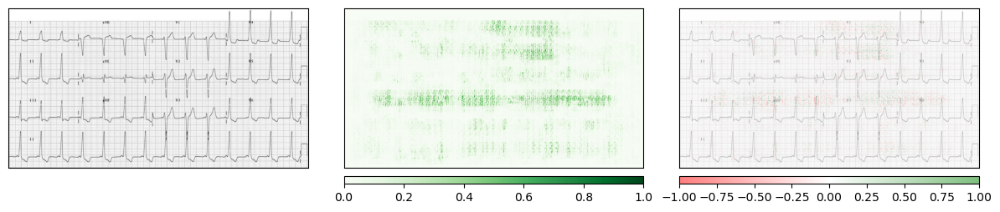

In [16]:
default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["original_image", "heat_map", "blended_heat_map"], 
    ["all", "positive", "all"],  
    show_colorbar=True,
    outlier_perc=20,
    fig_size=(12, 12) 
)

## Captum AI - Noise Tunnel (NT) with Integrated Gradients

Next, to smooth the results, we can use Captum AI’s Noise Tunnel technique, which adds noise to the input image. We'll use the `smoothgrad_sq` variant, which applies the well-known *SmoothGrad* technique to make the attributions more stable and less noisy.

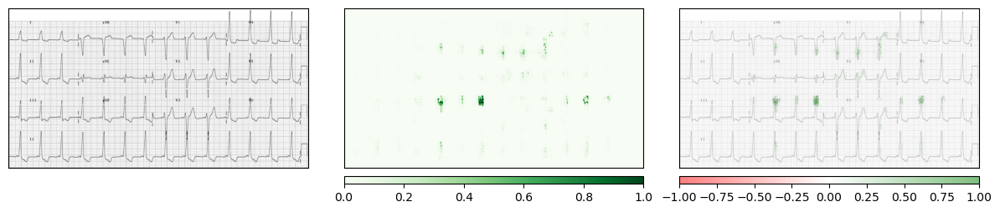

In [17]:
default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["original_image", "heat_map", "blended_heat_map"], 
    ["all", "positive", "all"],  
    show_colorbar=True,
    outlier_perc=20,
    fig_size=(12, 12) 
)


We can see that the SmoothGrad image is quite sparse, with only a few regions highlighted. This could happen because weaker attributions are smoothed out, leaving only the most significant areas that consistently influence the model's decision. Additionally, the model may be particularly sensitive to specific features, causing it to focus only on key areas in the input image.

## Captum AI - GradientShap

Gradient Shap is a method based on **Shapley values** from cooperative game theory, used to explain a model's predictions by calculating how the gradients of the model's output change as the input is perturbed between a baseline and the actual input. Unlike Integrated Gradients (IG), which checks along a straight line from the baseline to the input, Gradient Shap **randomly selects points along this path and computes the value of the gradients at these points**. It also uses a **baseline distribution, such as a mix between a black and a white image**, to introduce randomness and compute an average attribution, providing a more comprehensive explanation of the model's decisions.

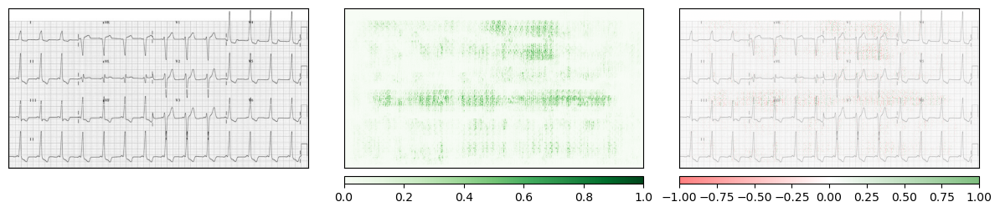

In [18]:
default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["original_image", "heat_map", "blended_heat_map"], 
    ["all", "positive", "all"],  
    show_colorbar=True,
    outlier_perc=20,
    fig_size=(12, 12) 
)

# A short summary

We began by producing a **saliency map** and quickly realized the importance of properly cropping the image. Without proper cropping, the model might assign high importance to irrelevant pixels, leading to misleading results. Next, we applied **SmoothGrad** to smooth the saliency map, implementing it efficiently by avoiding the need to save all the intermediate images.

After that, we worked with an ECG image that was classified as positive for *Wolff-Parkinson-White disease*. We computed **LIME** on the image to explain the important pixels of our complex model using a simpler model. Interestingly, LIME highlighted regions that didn’t have a strong gradient, while regions with a high gradient were not marked. Moreover, none of the highlighted areas actually touched the ECG line, which could indicate that the model might be focusing on irrelevant areas, a potential flaw in its interpretability.

Next, we created a **counterfactual image** and found that only a slight change in the image was enough to flip the model’s prediction. This suggests the model might be overfitting or is not robust to minor variations in the input.

We then applied **Captum’s sliding window** approach. Compared to SmoothGrad, some regions with strong gradients in SmoothGrad appeared less impactful here, and vice versa. This indicated that the model was considering the neighborhood around each pixel rather than just the pixel itself. Even pixels with low gradients could still significantly influence the model’s decision because of the surrounding area.

Following this, we used **Captum’s Integrated Gradients**, which produced an image filled with numerous gradient dots. We then applied **Noise Tunnel** with SmoothGrad, which resulted in a much sparser map. This suggested that relatively few regions consistently influenced the model’s decisions. 

Lastly, we used **Gradient SHAP**, and the resulting plot was similar to the Integrated Gradients one. This similarity can occur because both methods rely on calculating gradients, though they do so in only slightly different ways.

## Some of the plots:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


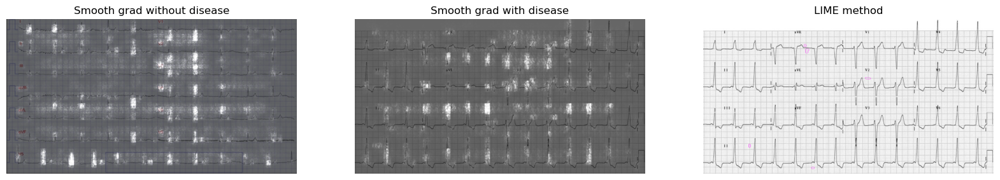

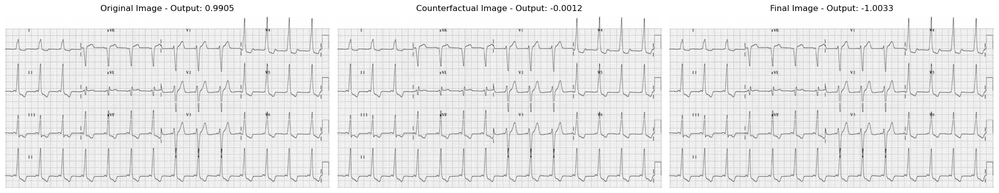

In [19]:
import matplotlib.pyplot as plt
import cv2

image3 = img = cv2.imread('output_lime.png')
images = [overlay1, overlay_2, image3]  
titles = ["Smooth grad without disease", "Smooth grad with disease", "LIME method"] 

fig, axes = plt.subplots(1, len(images), figsize=(20, 10))  
for ax, img, title in zip(axes, images, titles):
    if isinstance(img, str):
        img = cv2.imread(img)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis("off")


image3 = img = cv2.imread('output_lime.png')
images = [original_image_counter_cpu, input_image_counter_0_cpu, input_image_counter_cpu]  
titles = [f"Original Image - Output: {starting_value:.4f}", f"Counterfactual Image - Output: {zero_output_class:.4f}", f"Final Image - Output: {final_output_class.item():.4f}"] 

fig, axes = plt.subplots(1, len(images), figsize=(20, 10))  
for ax, img, title in zip(axes, images, titles):
    if isinstance(img, str):
        img = cv2.imread(img)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()



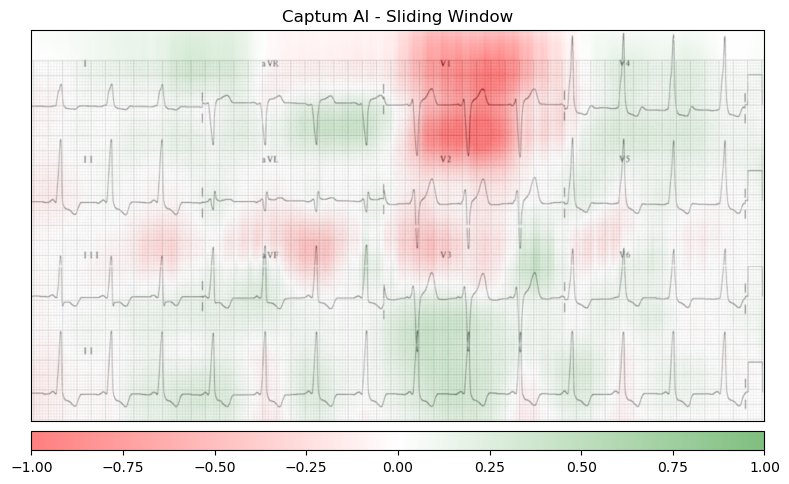

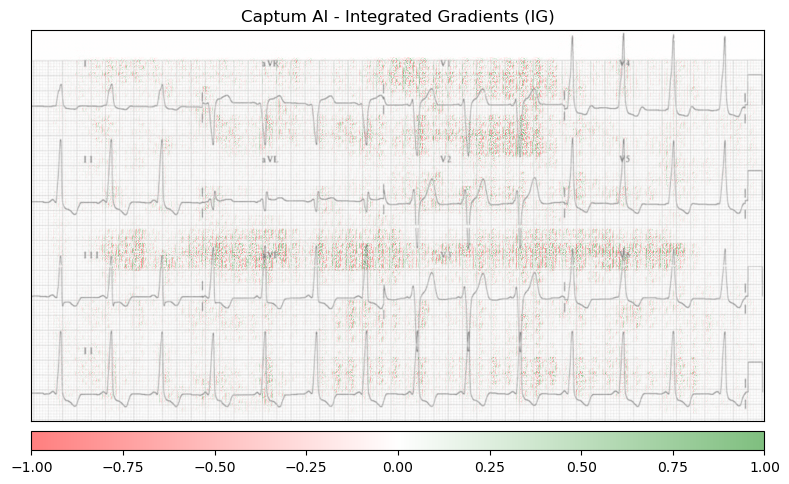

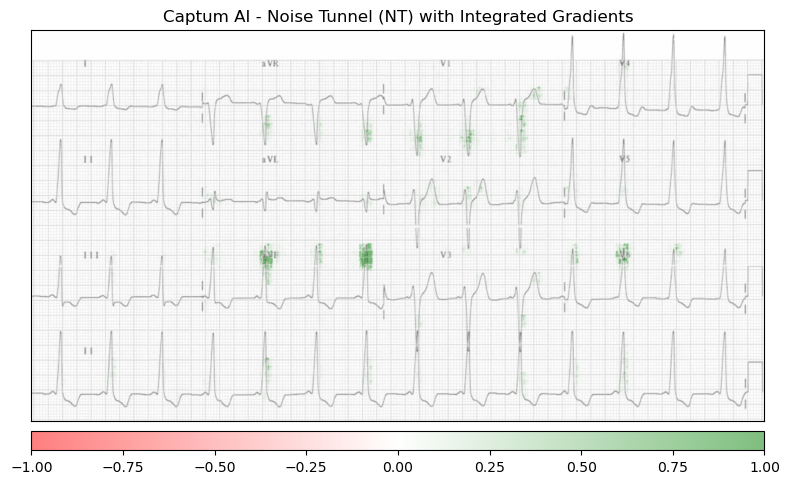

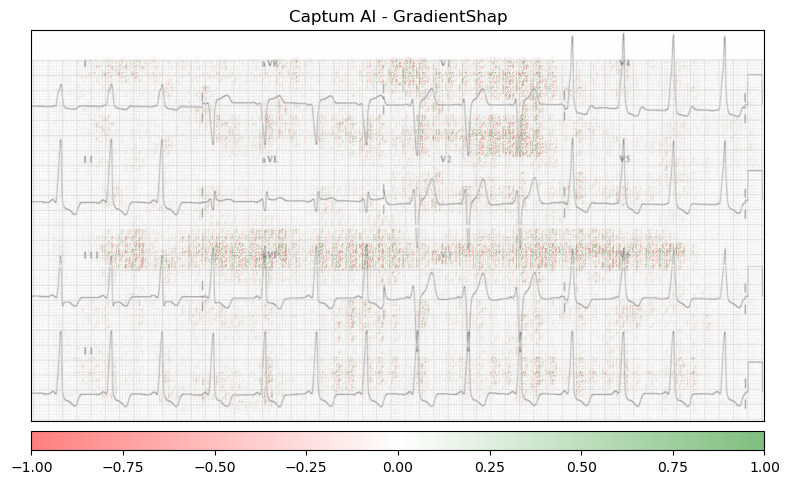

In [20]:
_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["blended_heat_map"], 
    ["all"], 
    show_colorbar=True,
    outlier_perc=2,
    fig_size=(8, 8),
    titles=["Captum AI - Sliding Window"]
)


_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["blended_heat_map"], 
    ["all"],  
    show_colorbar=True,
    outlier_perc=20,
    fig_size=(8, 8),
    titles=["Captum AI - Integrated Gradients (IG)"]
)

_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["blended_heat_map"], 
    ["all"],  
    show_colorbar=True,
    outlier_perc=20,
    fig_size=(8, 8),
    titles=["Captum AI - Noise Tunnel (NT) with Integrated Gradients"]
)

_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1, 2, 0)), 
    np.transpose(input_image.squeeze().cpu().detach().numpy(), (1, 2, 0)),  
    ["blended_heat_map"], 
    ["all"],  
    show_colorbar=True,
    outlier_perc=20,
    fig_size=(8, 8),
    titles=["Captum AI - GradientShap"]
)